#Title: Dog🐕‍🦺 Vision Project

## 1. Problem Definition
> We're assign to make an image classification model which can able to classify different dog breeds just by seeing their picture

## 2. Data Collection:
The Data is taken from kaggle competition, the data has train,test images and respective labels.
Link: [https://www.kaggle.com/c/dog-breed-identification/data]

## 3. Our possible approach to solve this case
We'll solve this problem using pre-build model like mobilenetv2 which is CNN (Convolutional Neural Networks) model trained over millions of images to give us better reults

#### Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub

#### Loading our data

In [ ]:
labels = pd.read_csv("/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/labels.csv")

In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
print(labels.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


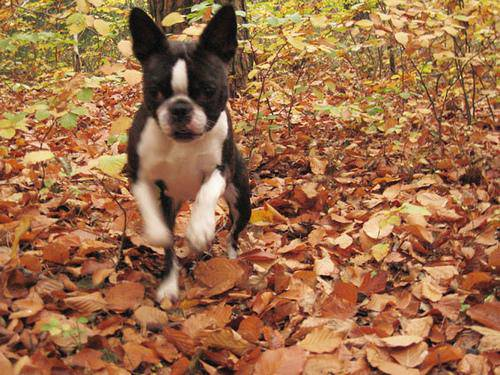

In [ ]:
from google.colab.patches import cv2_imshow
import cv2 as cv
image = cv.imread("/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/000bec180eb18c7604dcecc8fe0dba07.jpg")
cv2_imshow(image)

since we got it the Id column contains the image names or you can say image info so make a single variable through which we can access our images without being writing a lengthy line of code

In [ ]:
Root_dir = "/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/"
filenames = [Root_dir + fname + ".jpg" for fname in labels['id']]
filenames[:10]

['/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/train/002a283a315af96

making display images function

In [ ]:
def display_img(filepath):
  img = cv.imread(filepath)
  cv2_imshow(img)

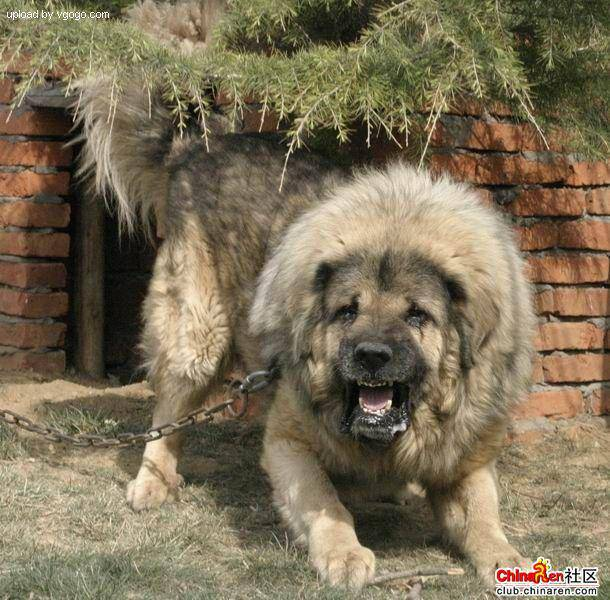

In [ ]:
display_img(filenames[9000])

In [ ]:
labels['breed'][9000]

'tibetan_mastiff'

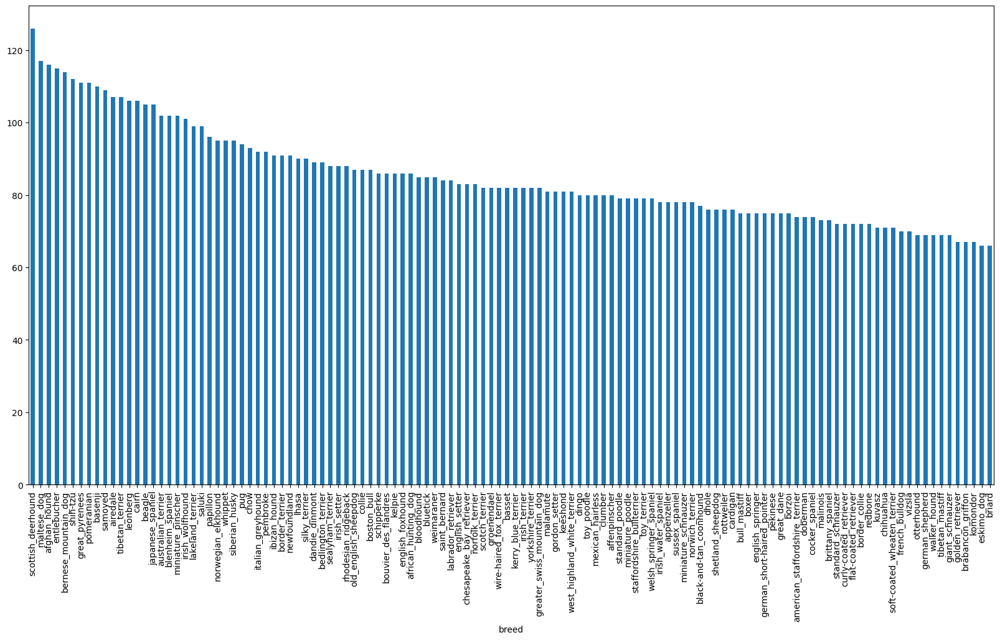

In [ ]:
labels['breed'].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels['breed'].value_counts().mean()

85.18333333333334

On average pre-class we have 85 images

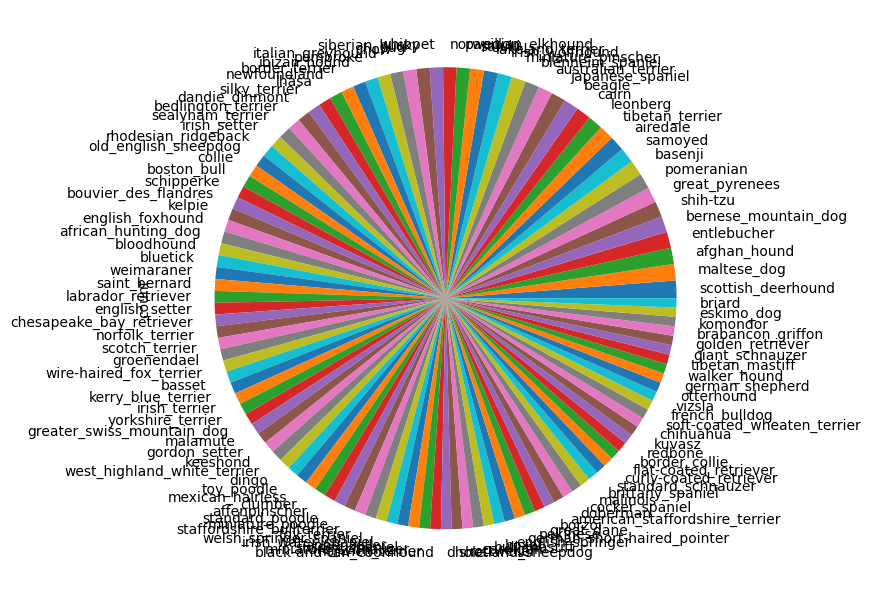

In [ ]:
labels['breed'].value_counts().plot.pie(figsize=(15,7.5));

In [ ]:
unique_breeds = np.unique(labels['breed'])

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

#### Converting lables into boolean

In [ ]:
labels.breed

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [ ]:
labels_array = labels['breed'].to_numpy()
labels_array

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
labels_array[0]

'boston_bull'

In [ ]:
labels_array[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

the above line of code shows that over the 120 unique breed on which index the dog breed is laying and shows it as true

In [ ]:
boolean_labels = [label == unique_breeds for label in labels_array]
boolean_labels[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
boolean_int = boolean_labels[0].astype(int) # just an example

In [ ]:
boolean_int

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

#### Creating our own Validation set

In [ ]:
X = filenames
y = boolean_labels

In [ ]:
len(X), len(y)

(10222, 10222)

We're working with a large dataset, having more than 10k images..! Before training the model on full dataset which is time taking we'll train our model on small dataset first then with respect to small model we'll train the large model

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)

In [ ]:
len(X_train), len(X_val)

(800, 200)

array([[[111,  56,  51],
        [106,  51,  46],
        [114,  59,  54],
        ...,
        [ 76,  25,  21],
        [ 76,  25,  21],
        [ 76,  25,  21]],

       [[100,  45,  40],
        [102,  47,  42],
        [108,  53,  48],
        ...,
        [ 75,  24,  20],
        [ 75,  24,  20],
        [ 75,  24,  20]],

       [[105,  50,  45],
        [110,  55,  50],
        [106,  51,  46],
        ...,
        [ 72,  23,  18],
        [ 72,  23,  18],
        [ 72,  23,  18]],

       ...,

       [[ 46,  22,  22],
        [ 41,  20,  19],
        [ 53,  29,  29],
        ...,
        [ 79,  34,  28],
        [ 78,  33,  27],
        [ 77,  32,  26]],

       [[ 48,  22,  23],
        [ 41,  17,  17],
        [ 50,  26,  26],
        ...,
        [ 79,  34,  28],
        [ 78,  33,  27],
        [ 77,  32,  26]],

       [[ 51,  23,  22],
        [ 41,  15,  14],
        [ 47,  21,  20],
        ...,
        [ 79,  34,  28],
        [ 78,  33,  27],
        [ 77,  32,  26]]], dtype=uint8)
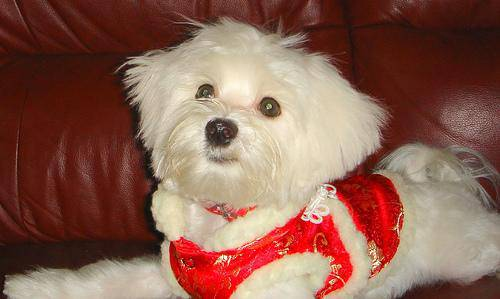

In [ ]:
from matplotlib.pyplot import imread
img = imread(filenames[12])
img

In [ ]:
tf.constant(img)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[111,  56,  51],
        [106,  51,  46],
        [114,  59,  54],
        ...,
        [ 76,  25,  21],
        [ 76,  25,  21],
        [ 76,  25,  21]],

       [[100,  45,  40],
        [102,  47,  42],
        [108,  53,  48],
        ...,
        [ 75,  24,  20],
        [ 75,  24,  20],
        [ 75,  24,  20]]], dtype=uint8)>

the above line of code images as a tensor

#### Preprocessing the Image

In this section we'll preprocess the image:
1. Converting images to tensors
2. Resizing the images to 224 by 224 size
3. Normalizing the image between 0-1 form 0-255


In [ ]:
import os
IMG_SIZE = 224
def process_image(image_path):
  """
  Process your image into tensor format by just passing its path
  """
  image = tf.io.read_file(image_path) # Convert the file path in tesor form
  image = tf.image.decode_jpeg(image,channels=3) # Decode the above path image into tensor form
  image = tf.image.convert_image_dtype(image,tf.float32) # Normalize the image
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

In [ ]:
process_image(filenames[42])[:2]

<tf.Tensor: shape=(2, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117759],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]]], dtype=float32)>

The same function as above but its mine

In [ ]:
import cv2 as cv
import os

# Define the size
img_size = 224

def process(img_path):
  """
  Process your images into tensor format by just passing its path
  """
  if os.path.exists(img_path):
    img = cv.imread(img_path) # Reading the image in numpy array form
    img = img/255.0 # normalizing the image
    img = cv.resize(img,(img_size,img_size)) # resizing the img
    img = tf.constant(img,dtype=tf.float32)
    return img
  else:
    print("Ops...! Image doesn't exist")

In [ ]:
process(filenames[42])[:2]

<tf.Tensor: shape=(2, 224, 3), dtype=float32, numpy=
array([[[0.33112472, 0.51836705, 0.3304206 ],
        [0.24877697, 0.44256473, 0.2546183 ],
        [0.24467787, 0.44756132, 0.26103652],
        ...,
        [0.32939783, 0.51666313, 0.29705527],
        [0.33667716, 0.52160364, 0.3007703 ],
        [0.33667716, 0.5249125 , 0.29746148]],

       [[0.28079125, 0.4498591 , 0.2646788 ],
        [0.2607433 , 0.43420267, 0.24902235],
        [0.2912145 , 0.4744622 , 0.28906113],
        ...,
        [0.31875685, 0.50133735, 0.28172952],
        [0.32794937, 0.51100725, 0.29044473],
        [0.33003464, 0.5156701 , 0.28995234]]], dtype=float32)>

#### Converting data in Batchs

before turing the data into batch we've to make the pairs of filenames and their respective labels pairs

In [ ]:
def get_img_labels(img_path,label):
  """
  Takes an image file path name and the assosciated label, processes the image and returns a type of
  (img,label)
  """
  img = process_image(img_path)
  return img, label

In [ ]:
get_img_labels(X[42],y[42]) # Demo of above function

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE = 32

def create_data_batches(X,y=None, batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates data batches of images X and labels y pairs.
  Shuffles the data if it's training data
  Also accepts the test data as input with no labels
  """
  # For Testing dataset
  if test_data:
    print("Creating test data batches...!")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # For Validation dataset
  elif valid_data:
    print("Creating validation data batches...!")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_img_labels).batch(BATCH_SIZE)
    return data_batch
  # For Training dataset
  else:
    print("Creating training data batches...!")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    shuffled_data = data.shuffle(buffer_size=len(X))

    data_batch = shuffled_data.map(get_img_labels).batch(BATCH_SIZE)

  return data_batch

In [ ]:
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...!
Creating validation data batches...!


In [ ]:
train_data.element_spec ,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#### Visualizing the data batch

In [ ]:
import matplotlib.pyplot as plt

def display_batch(images,labels):
  plt.figure(figsize=(15,10))

  #loop through batch
  for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

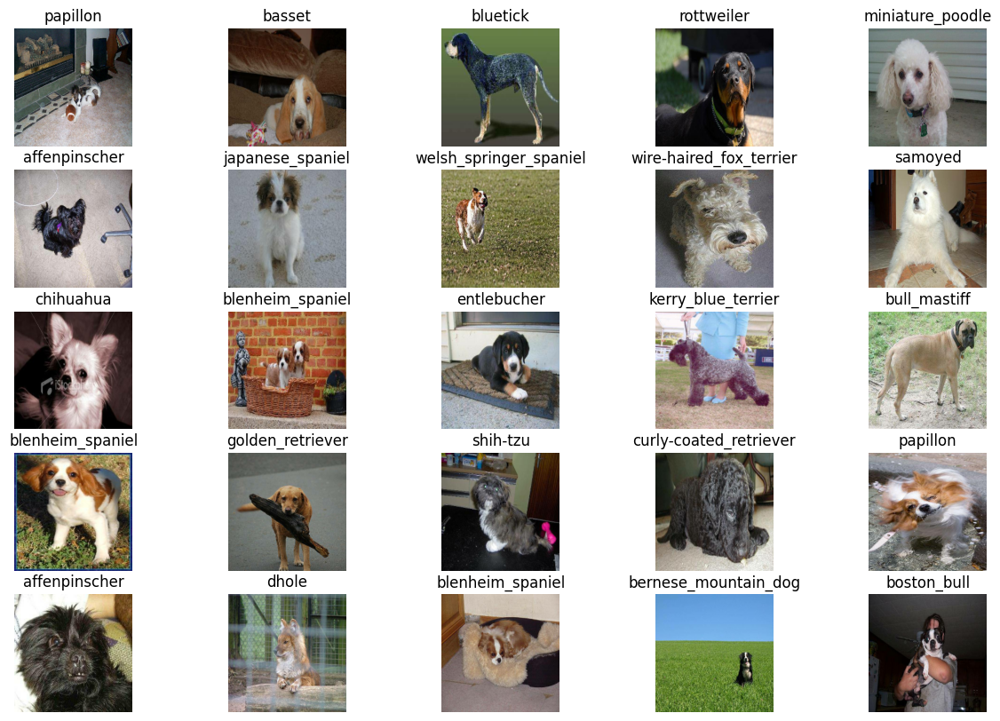

In [ ]:
train_images , train_labels = next(train_data.as_numpy_iterator())
display_batch(train_images,train_labels)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.applications.mobilenet_v2 import MobileNetV2

#### Building a Model

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Input
from tensorflow.keras.optimizers import Adam

# Ensure IMG_SIZE is defined correctly, for example, if IMG_SIZE = 224
IMG_SIZE = 224  # or any other size you're using
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)  # Use tuple format here
OUTPUT_SHAPE = len(unique_breeds)

# Define the input layer
inputs = Input(shape=INPUT_SHAPE)

# MobileNetV2 base model with dynamic input shape
Mobile_base = MobileNetV2(
    weights='imagenet',
    include_top=False,  # We are not including the top classification layers
    input_shape=INPUT_SHAPE
)

Mobile_base.trainable = False

# Pass the input through the MobileNetV2 base model
x = Mobile_base(inputs)

# Add Flatten and Dense layers
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
outputs = Dense(OUTPUT_SHAPE, activation='softmax')(x)

# Create the model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(),
              loss='CategoricalCrossentropy',
              metrics=['accuracy'])

# Print the model summary to check for shape issues
print(model.summary())

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 62720)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       8,028,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 120)                 │          15,480 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,301,752 (39.30 MB)

 Trainable params: 8,043,768 (30.68 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

None


#### Creating TensorBoard Callback functions

The Callback functions are helper function, these functions helps the model to train properly without being overfit...! In short it prevents the model from overfitting



In [ ]:
#load the tensorboad
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime as dt

def create_tb_callback():
  logdir = os.path.join("/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Untitled Folder",
                        dt.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=2)

#### Traing the subset model on 1000 Images

In [ ]:
NUM_EPOCHS = 20 # @param {"type":"slider","min":10,"max":100,"step":5}

In [ ]:
# Defining the callback variables for our ease
tensorboard = create_tb_callback()

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

model.fit(x=train_data,
          epochs=NUM_EPOCHS,
          validation_data = val_data,
          validation_freq=1,
          callbacks=[tensorboard,early_stopping])

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
model.fit(x=train_data,
          epochs=NUM_EPOCHS,
          validation_data = val_data,
          validation_freq=1,
          callbacks=[tensorboard,early_stopping])

Epoch 1/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 202s 8s/step - accuracy: 0.0299 - loss: 7.4055 - val_accuracy: 0.0550 - val_loss: 4.5773
Epoch 2/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - accuracy: 0.1954 - loss: 3.5180 - val_accuracy: 0.1000 - val_loss: 4.2888
Epoch 3/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.4141 - loss: 2.4297 - val_accuracy: 0.1450 - val_loss: 4.3405
Epoch 4/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - accuracy: 0.5701 - loss: 1.7497 - val_accuracy: 0.1450 - val_loss: 4.3116
Epoch 5/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - accuracy: 0.7024 - loss: 1.1247 - val_accuracy: 0.2350 - val_loss: 3.9193
Epoch 6/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - accuracy: 0.8267 - loss: 0.6292 - val_accuracy: 0.2850 - val_loss: 4.2249
Epoch 7/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.9087 - loss: 0.3417 - val_accuracy: 0.2850 - val_loss: 4.0123
Epoch 8/20
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 169ms/step - accuracy: 0.9487 - loss: 0.2083 - val_accuracy: 0.3

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/logs"

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
predictions = model.predict(val_data,verbose=1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 8s 645ms/step


In [ ]:
predictions[0]

array([6.85800216e-04, 1.55995665e-02, 8.92803314e-07, 9.03181091e-04,
       9.32887080e-04, 2.44945024e-08, 1.85051579e-02, 5.21186274e-03,
       1.45825194e-04, 9.67468949e-08, 1.80346688e-05, 1.96468274e-04,
       5.98689931e-10, 2.24679272e-04, 3.24698306e-07, 7.03440455e-05,
       8.27657859e-05, 6.62899064e-03, 3.30611045e-04, 2.91779161e-05,
       6.18663442e-04, 2.50629313e-07, 4.34539266e-10, 1.01804375e-07,
       1.97651173e-10, 2.47302488e-03, 2.05841541e-01, 6.86006533e-05,
       6.97295880e-04, 1.68135266e-05, 8.42966765e-05, 2.31937878e-03,
       1.60728212e-06, 1.65033649e-04, 1.78623799e-04, 1.48556195e-03,
       3.79842800e-06, 1.88442157e-03, 1.05740428e-09, 1.45368085e-06,
       6.47238849e-08, 1.69617973e-08, 9.69646226e-06, 2.85751489e-03,
       5.15605822e-11, 7.09484368e-07, 5.44429968e-09, 1.92600424e-09,
       1.35441365e-08, 1.62597317e-07, 1.84899221e-07, 1.44570379e-03,
       9.69805569e-09, 1.01537729e-07, 4.18155111e-08, 9.02024055e-09,
      

In [ ]:
len(predictions)

200

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())

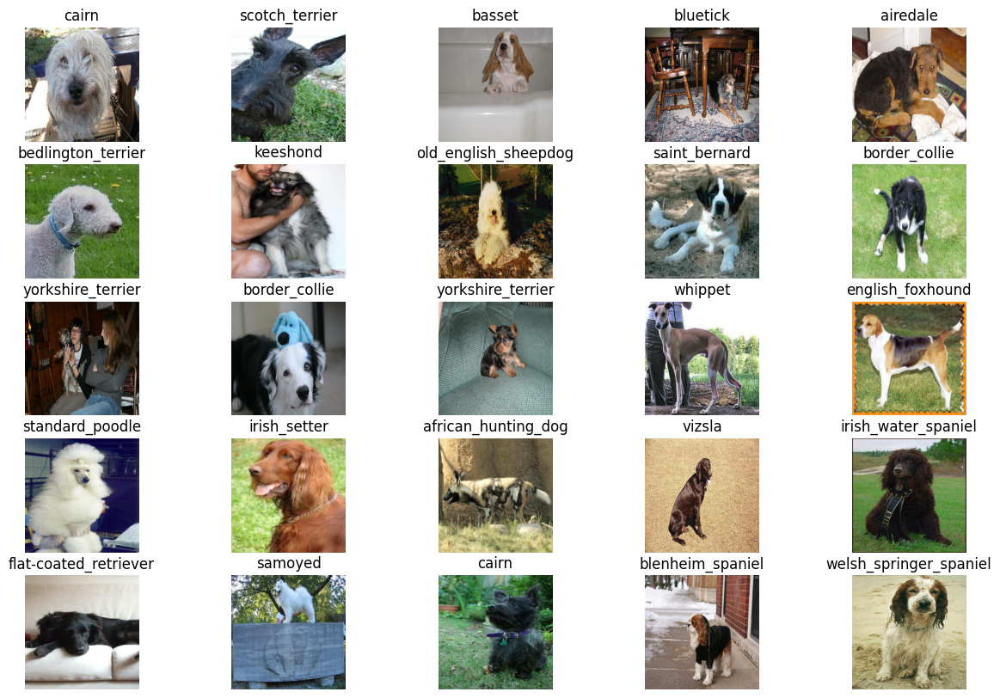

In [ ]:
display_batch(val_images,val_labels)

#### Converting the confidence probabilites into labels

In [ ]:
def get_pred_label(preds_proba):
  """
  Truns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(preds_proba)]

In [ ]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, labels) pair tensor and returns separate arrays of images and labels
  """
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
  return images, labels

In [ ]:
val_images, val_labels = unbatchify(val_data)

In [ ]:
val_images[0]

array([[[0.29599646, 0.43284872, 0.3056691 ],
        [0.26635826, 0.32996926, 0.22846507],
        [0.31428418, 0.27701408, 0.22934894],
        ...,
        [0.77614343, 0.82320225, 0.8101595 ],
        [0.81291157, 0.8285351 , 0.8406944 ],
        [0.8209297 , 0.8263737 , 0.8423668 ]],

       [[0.2344871 , 0.31603682, 0.19543913],
        [0.3414841 , 0.36560842, 0.27241898],
        [0.45016077, 0.40117094, 0.33964607],
        ...,
        [0.7663987 , 0.8134138 , 0.81350833],
        [0.7304248 , 0.75012016, 0.76590735],
        [0.74518913, 0.76002574, 0.7830809 ]],

       [[0.30157745, 0.3082587 , 0.21018331],
        [0.2905954 , 0.27066195, 0.18401104],
        [0.4138316 , 0.36170745, 0.2964005 ],
        ...,
        [0.79871625, 0.8418535 , 0.8606443 ],
        [0.7957738 , 0.82859945, 0.8605655 ],
        [0.75181633, 0.77904975, 0.8155256 ]],

       ...,

       [[0.9746779 , 0.9878955 , 0.9342279 ],
        [0.99153054, 0.99772066, 0.9427856 ],
        [0.98925114, 0

In [ ]:
val_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
val_label = get_pred_label(val_labels[4])
val_label

'airedale'

#### Visviualizing the Predictions

In [ ]:
def display_pred(images, preds_labels, true_labels):
    plt.figure(figsize=(20, 10))
    for i in range(25):
        plt.subplot(5, 5, i + 1)
        plt.imshow(images[i])  # Display a single image
        true_label = get_pred_label(true_labels[i])
        pred_label = get_pred_label(preds_labels[i])
        if true_label == pred_label:
          color = 'green'
        else:
          color = 'red'
        plt.title(f"True Label: {true_label}\nPred Label: {pred_label}\nConfidence:{np.max(preds_labels[i])*100:.2f}%",color=color)
        plt.axis('off')  # Optional: Hide axis for cleaner display
    plt.tight_layout()
    plt.show()

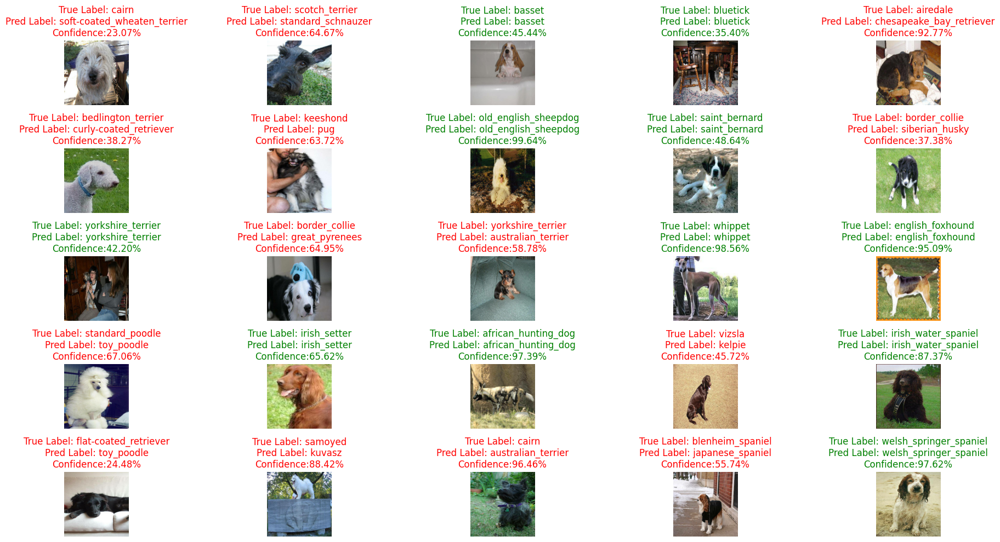

In [ ]:
display_pred(val_images,predictions,val_labels)

#### Saving and loading the model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves the given model to specific directory
  """
  ROOT_DIR = "/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Saved_model"
  modeldir = os.path.join(ROOT_DIR,
                          dt.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f'Saving model to {model_path}')
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Load the saved model from the path
  """
  print(f"Loading the saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Saving...!

In [ ]:
save_model(model,suffix="1000-img-subset-mobilenetV2-model")

Saving model to /content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Saved_model/20240924-140217-1000-img-subset-mobilenetV2-model.h5


'/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Saved_model/20240924-140217-1000-img-subset-mobilenetV2-model.h5'

In [ ]:
loaded_model = load_model("/content/drive/MyDrive/Machine Learning/20240924-140217-1000-img-subset-mobilenetV2-model.h5")
loaded_model

Loading the saved model from: /content/drive/MyDrive/Machine Learning/20240924-140217-1000-img-subset-mobilenetV2-model.h5


<Functional name=functional, built=True>

In [ ]:
loaded_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
y_preds = loaded_model.predict(val_data,verbose=1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 474ms/step


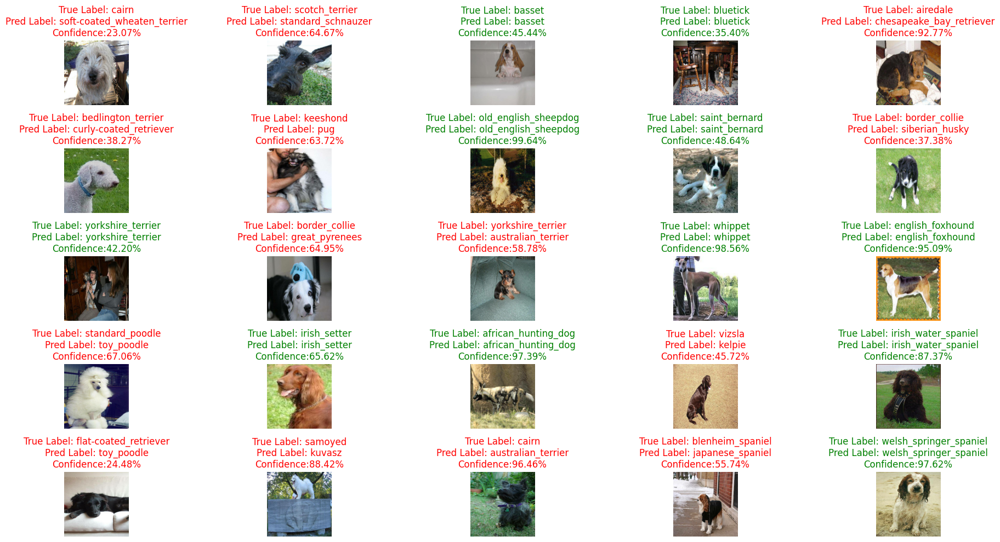

In [ ]:
display_pred(val_images,y_preds,val_labels)

#### Training on Full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X,y)

Creating training data batches...!


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Building a functional model

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Input
from tensorflow.keras.optimizers import Adam

# Ensure IMG_SIZE is defined correctly, for example, if IMG_SIZE = 224
IMG_SIZE = 224  # or any other size you're using
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)  # Use tuple format here
OUTPUT_SHAPE = len(unique_breeds)

# Define the input layer
inputs = Input(shape=INPUT_SHAPE)

# MobileNetV2 base model with dynamic input shape
Mobile_base = MobileNetV2(
    weights='imagenet',
    include_top=False,  # We are not including the top classification layers
    input_shape=INPUT_SHAPE
)

Mobile_base.trainable = False

# Pass the input through the MobileNetV2 base model
x = Mobile_base(inputs)

# Add Flatten and Dense layers
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
outputs = Dense(OUTPUT_SHAPE, activation='softmax')(x)

# Create the model
full_model = Model(inputs=inputs, outputs=outputs)

# Compile the model
full_model.compile(optimizer=Adam(),
              loss='CategoricalCrossentropy',
              metrics=['accuracy'])

# Print the model summary to check for shape issues
print(model.summary())

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 62720)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       8,028,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 120)                 │          15,480 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,301,752 (39.30 MB)

 Trainable params: 8,043,768 (30.68 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

None


Setting up the callbacks for full dataset

In [ ]:
full_model_tensorboard = create_tb_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                  patience=2)

fitting the model

In [ ]:
full_model.fit(full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/20
202/320 ━━━━━━━━━━━━━━━━━━━━ 10:44 5s/step - accuracy: 0.0977 - loss: 4.9369

In [ ]:
save_model(full_model,suffix="full-dataset-mobilenetV2-model")

## Testing the model on Test Images

In [ ]:
loaded_model = load_model("/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Saved_model/20240924-151645-full-dataset-mobilenetV2-model.h5")
loaded_model

Loading the saved model from: /content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Saved_model/20240924-151645-full-dataset-mobilenetV2-model.h5


<Functional name=functional_4, built=True>

#### Importing the test data

In [ ]:
test_path = "/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/e2915c191c0bc761b795b78f66845fe0.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/e141811c20cade75f5cb3b7da86320a8.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/e6b1859592468c8ffc1a73f87b201ba7.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/e1e6d180a31b0a9c0d741d0f142ea6af.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/e34654831e228ad3ac1d0c463e70caf6.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/e800b6c8d2904e205d67ada800907762.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/test/e5f207e00213cc76be3ae92

In [ ]:
test_data_batch = create_data_batches(test_filenames,test_data=True)

Creating test data batches...!


In [ ]:
test_data_batch

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_preds = loaded_model.predict(test_data_batch,
                                  verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 2309s 7s/step


In [ ]:
np.savetxt("/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Test_preds.csv",test_preds,delimiter=',')

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Test_preds.csv",delimiter=',')

In [ ]:
test_predictions.shape

(10357, 120)

In [ ]:
len(test_filenames)

10357

#### Predicition on our images

In [ ]:
custom_path = "/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Test on our Images/"
# Use os.listdir to get the list of filenames in the directory
custom_filenames = [custom_path + fname for fname in os.listdir(custom_path)]
custom_filenames[:4]

['/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Test on our Images/A10.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Test on our Images/A11.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Test on our Images/A7.jpg',
 '/content/drive/MyDrive/Machine Learning/projects/Dog_vision_project/project data/Test on our Images/A8.jpg']

In [ ]:
custom_data_batch = create_data_batches(custom_filenames,test_data=True)

Creating test data batches...!


In [ ]:
custom_data_batch

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_model.predict(custom_data_batch,
                                  verbose=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [ ]:
custom_images = []

for image in custom_data_batch.unbatch().as_numpy_iterator():
  custom_images.append(image)

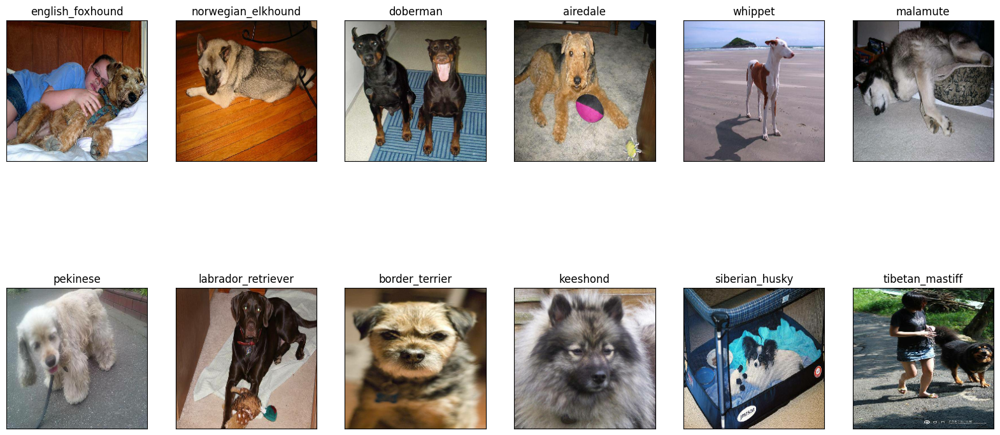

In [ ]:
plt.figure(figsize=(20,10))
for i, image in enumerate(custom_images):
  plt.subplot(2,6,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(get_pred_label(custom_preds[i]))
  plt.imshow(image)

In [ ]:
my is not predicting